In [1]:
!pip install folium 

import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt 
import folium  
from folium.plugins import MarkerCluster 
import geopandas as gpd


In [2]:
df =  pd.read_csv("/Users/adrianamenjivar/Downloads/globalterrorismdb_0718dist.csv", encoding='latin1', low_memory=False)

#So low_memory=False tells Pandas: "Don't worry about saving memory, just load the whole thing properly and figure out the correct data types later."
#'latin1' is a common encoding used when the file has non-English characters and 'utf-8' doesn't work.

Lets think!

- Whats the mission? 
- What’s in this data?(You need to know what kind of info each row gives you)
- Who/What am I trying to analyze?	(e.g., Countries? Groups? Years?)
- What do I want to find out?	Trends? Hotspots? High-kill events?
- Need to answer questions like “Where is enemy activity highest? What group is most dangerous? Are there signs of coordination?”


Now with that in mind lets clean the data inorder to succesfully answer those PIRs

# Task	 &   What It Tells you

- .shape	 How many rows (events) and columns
- .info()	 What types of data you have (numbers, text, missing stuff)
- .head() 	What a sample of your data looks like
- .describe() 	Stats: avg deaths, max wounds, etc.
- .isnull().sum() 	Which columns are missing lots of data
- .value_counts()	 Who or where is most active? (e.g. gname, country_txt)

In [3]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [4]:
df.shape

#135 columns & 181,691 rows

(181691, 135)

In [5]:
df.describe()

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,1.816910e+05,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2.002705e+11,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,1.325957e+09,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1.970000e+11,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1.991021e+11,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2.009022e+11,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2.014081e+11,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2.017123e+11,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


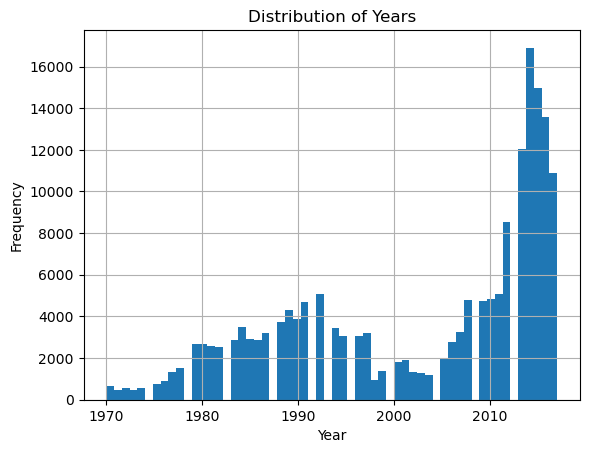

In [6]:
#lets see the std and mean relationship just shows attacks per year 

df['iyear'].hist(bins='auto') #auto lets matplot lib pick the best one for the data
plt.title('Distribution of Years')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.show()




In [7]:
df['iyear'].value_counts(sort=True)

#count the attacks per year the code above visualizes this

iyear
2014    16903
2015    14965
2016    13587
2013    12036
2017    10900
2012     8522
2011     5076
1992     5071
2010     4826
2008     4805
2009     4721
1991     4683
1989     4324
1990     3887
1988     3721
1984     3495
1994     3456
2007     3242
1997     3197
1987     3183
1995     3081
1996     3058
1985     2915
1983     2870
1986     2860
2006     2758
1979     2662
1980     2662
1981     2586
1982     2544
2005     2017
2001     1906
2000     1814
1978     1526
1999     1395
2002     1333
1977     1319
2003     1278
2004     1166
1998      934
1976      923
1975      740
1970      651
1974      581
1972      568
1973      473
1971      471
Name: count, dtype: int64

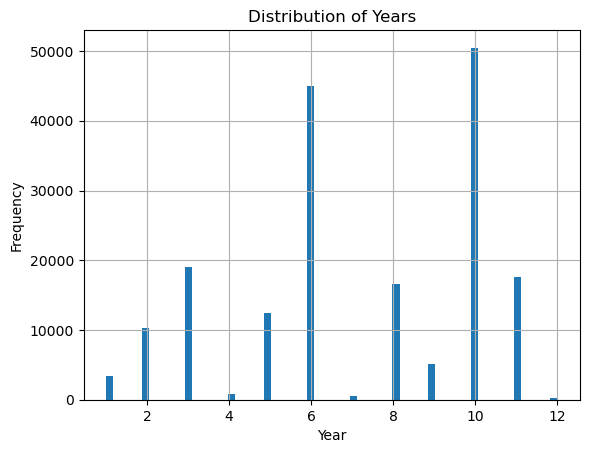

In [8]:
#lets see the std and mean relationship

df['region'].hist(bins='auto')
plt.title('Distribution of Years')
plt.xlabel('Year')
plt.ylabel('Frequency')
plt.show()

#visualizing count of attacks per region

In [9]:
df["region"].value_counts(sort=True)
#region with the most attacks

region
10    50474
6     44974
3     18978
11    17550
8     16639
5     12485
2     10344
9      5144
1      3456
4       802
7       563
12      282
Name: count, dtype: int64

In [10]:
df.groupby(['iyear', 'region']).size().sort_values(ascending=False)
#groupby[thecolumns u wanna see data for .size adds/counts everytime a row is filled for it then sort it


iyear  region
2014   10        6939
2016   10        6115
2015   10        6036
2014   6         4998
2013   6         4612
                 ... 
1971   12           1
1972   9            1
1987   9            1
1973   6            1
2010   2            1
Length: 529, dtype: int64

In [11]:
df.isnull().sum().sort_values(ascending=False)

#seeing which columns have alot of nulls
# Rule of thumb: If 90%+ of a column is NaN, it’s usually safe to drop — unless you have a reason to save it.
#IGNORE columns you’re not using yet Keep them for now but don’t waste time analyzing them

gsubname3           181671
weapsubtype4_txt    181621
weapsubtype4        181621
weaptype4           181618
weaptype4_txt       181618
                     ...  
suicide                  0
success                  0
crit3                    0
property                 0
eventid                  0
Length: 135, dtype: int64

In [12]:
df['gsubname3'].isnull().mean() > 0.90  # if True, drop it 

#How to check of the columns are over 90% empty w nulls


True

FOR NULLS!

- Mostly empty + Not needed → DROP

- Some missing + You care about it → KEEP and CLEAN

- Important to your PIR → NEVER drop unless you’ve saved a copy

- keep if It has less than 20–30% missing, and you can fill or work around it

-  Rule of thumb: If 90%+ of a column is NaN, it’s usually safe to drop — unless you have a reason to save it.

- IGNORE columns you’re not using yet Keep them for now but don’t waste time analyzing them

In [13]:
# Step 1: Get % of missing values for each column
missing_percent = df.isnull().mean() * 100  # gives % instead of count

# Step 2: Filter to keep only columns with less than 30% missing
columns_to_keep = missing_percent[missing_percent < 30].index #.index gives you the labels (names) of the items that passed your condition.

# Step 3: Create a new DataFrame with only those columns
df_cleaned = df[columns_to_keep]

# Optional: Check what you kept
print(df_cleaned.columns)


#This gives u columns names to work with and keep becasue they have only 20/30% info missing

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'crit1', 'crit2', 'crit3',
       'doubtterr', 'multiple', 'success', 'suicide', 'attacktype1',
       'attacktype1_txt', 'targtype1', 'targtype1_txt', 'targsubtype1',
       'targsubtype1_txt', 'corp1', 'target1', 'natlty1', 'natlty1_txt',
       'gname', 'guncertain1', 'individual', 'weaptype1', 'weaptype1_txt',
       'weapsubtype1', 'weapsubtype1_txt', 'nkill', 'nwound', 'property',
       'ishostkid', 'dbsource', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')


In [14]:
# Step 1: Calculate % missing
missing_percent = df.isnull().mean() * 100

# Step 2: Only keep columns with less than 90% missing
columns_to_keep = missing_percent[missing_percent > 90].index

# Step 3: Create a cleaned dataframe
df_cleaned = df[columns_to_keep]

# Check columns you kept
print(df_cleaned.columns)

#These have over 90% of their data missing. keep column only if need


Index(['approxdate', 'resolution', 'attacktype2', 'attacktype2_txt',
       'attacktype3', 'attacktype3_txt', 'targtype2', 'targtype2_txt',
       'targsubtype2', 'targsubtype2_txt', 'corp2', 'target2', 'natlty2',
       'natlty2_txt', 'targtype3', 'targtype3_txt', 'targsubtype3',
       'targsubtype3_txt', 'corp3', 'target3', 'natlty3', 'natlty3_txt',
       'gsubname', 'gname2', 'gsubname2', 'gname3', 'gsubname3', 'guncertain2',
       'guncertain3', 'claim2', 'claimmode2', 'claimmode2_txt', 'claim3',
       'claimmode3', 'claimmode3_txt', 'compclaim', 'weaptype2',
       'weaptype2_txt', 'weapsubtype2', 'weapsubtype2_txt', 'weaptype3',
       'weaptype3_txt', 'weapsubtype3', 'weapsubtype3_txt', 'weaptype4',
       'weaptype4_txt', 'weapsubtype4', 'weapsubtype4_txt', 'nhostkid',
       'nhostkidus', 'nhours', 'ndays', 'divert', 'kidhijcountry', 'ransomamt',
       'ransomamtus', 'ransompaid', 'ransompaidus', 'ransomnote',
       'hostkidoutcome', 'hostkidoutcome_txt', 'nreleased'],
 

In [15]:
cols_to_drop = [
    'approxdate', 'resolution', 'attacktype2', 'attacktype2_txt',
    'attacktype3', 'attacktype3_txt', 'targtype2', 'targtype2_txt',
    'targsubtype2', 'targsubtype2_txt', 'corp2', 'target2', 'natlty2',
    'natlty2_txt', 'targtype3', 'targtype3_txt', 'targsubtype3',
    'targsubtype3_txt', 'corp3', 'target3', 'natlty3', 'natlty3_txt',
    'gsubname', 'gname2', 'gsubname2', 'gname3', 'gsubname3', 'guncertain2',
    'guncertain3', 'claim2', 'claimmode2', 'claimmode2_txt', 'claim3',
    'claimmode3', 'claimmode3_txt', 'compclaim', 'weaptype2',
    'weaptype2_txt', 'weapsubtype2', 'weapsubtype2_txt', 'weaptype3',
    'weaptype3_txt', 'weapsubtype3', 'weapsubtype3_txt', 'weaptype4',
    'weaptype4_txt', 'weapsubtype4', 'weapsubtype4_txt', 'nhostkid',
    'nhostkidus', 'nhours', 'ndays', 'divert', 'kidhijcountry', 'ransomamt',
    'ransomamtus', 'ransompaid', 'ransompaidus', 'ransomnote',
    'hostkidoutcome', 'hostkidoutcome_txt', 'nreleased'
]


In [16]:
df = df.drop(columns=cols_to_drop)
#reset df and drop

In [17]:
df.isnull().sum().sort_values(ascending=False)


claimmode_txt      162608
claimmode          162608
related            156653
addnotes           153402
alternative_txt    152680
                    ...  
targtype1               0
targtype1_txt           0
iyear                   0
individual              0
gname                   0
Length: 73, dtype: int64

In [18]:
df.columns.tolist()
#getting a list of all the columns we got to clean with NANs

['eventid',
 'iyear',
 'imonth',
 'iday',
 'extended',
 'country',
 'country_txt',
 'region',
 'region_txt',
 'provstate',
 'city',
 'latitude',
 'longitude',
 'specificity',
 'vicinity',
 'location',
 'summary',
 'crit1',
 'crit2',
 'crit3',
 'doubtterr',
 'alternative',
 'alternative_txt',
 'multiple',
 'success',
 'suicide',
 'attacktype1',
 'attacktype1_txt',
 'targtype1',
 'targtype1_txt',
 'targsubtype1',
 'targsubtype1_txt',
 'corp1',
 'target1',
 'natlty1',
 'natlty1_txt',
 'gname',
 'motive',
 'guncertain1',
 'individual',
 'nperps',
 'nperpcap',
 'claimed',
 'claimmode',
 'claimmode_txt',
 'weaptype1',
 'weaptype1_txt',
 'weapsubtype1',
 'weapsubtype1_txt',
 'weapdetail',
 'nkill',
 'nkillus',
 'nkillter',
 'nwound',
 'nwoundus',
 'nwoundte',
 'property',
 'propextent',
 'propextent_txt',
 'propvalue',
 'propcomment',
 'ishostkid',
 'ransom',
 'addnotes',
 'scite1',
 'scite2',
 'scite3',
 'dbsource',
 'INT_LOG',
 'INT_IDEO',
 'INT_MISC',
 'INT_ANY',
 'related']

When filling NaNs
- i like to look at dtypes and then from there fill accordingly 

In [19]:
df['nkill'] = df['nkill'].fillna(0)
df['nkillus'] = df['nkillus'].fillna(0)
df['nkillter'] = df['nkillter'].fillna(0)
df['nwound'] = df['nwound'].fillna(0)
df['nwoundus'] = df['nwoundus'].fillna(0)
df['nwoundte'] = df['nwoundte'].fillna(0)
df['nperps'] = df['nperps'].fillna(0)
df['nperpcap'] = df['nperpcap'].fillna(0)

#were pulling from the df saying hey in this column = column name fillna with 

In [20]:
text_cols = ['motive', 'summary', 'location', 'corp1', 'target1', 'weapdetail',
             'propcomment', 'addnotes', 'scite1', 'scite2', 'scite3', 'related']
# were making a list of columns we want to fill with text not int
for col in text_cols:
    df[col] = df[col].fillna("Unknown")

#making a loop saying in these columns list fill with unkown


In [21]:
binary_cols = ['property', 'ransom', 'suicide', 'success', 'claimed', 'ishostkid']
df[binary_cols].isnull().sum()
#Let’s check for any missing in those before we fill

property          0
ransom       104310
suicide           0
success           0
claimed       66120
ishostkid       178
dtype: int64

In [22]:
df['ransom'] = df['ransom'].fillna(-9)
df['claimed'] = df['claimed'].fillna(-9)
df['ishostkid'] = df['ishostkid'].fillna(-9)
#-9 means missing/not reported

In [23]:
df.isnull().sum()

eventid     0
iyear       0
imonth      0
iday        0
extended    0
           ..
INT_LOG     0
INT_IDEO    0
INT_MISC    0
INT_ANY     0
related     0
Length: 73, dtype: int64

In [24]:
df[['iyear', 'region_txt', 'claimed', 'gname']]
#this is saying in the df show me only these rows can do .head() for jsut 5


,iyear,region_txt,claimed,gname
0,1970,Central America & Caribbean,-9.0,MANO-D
1,1970,North America,-9.0,23rd of September Communist League
2,1970,Southeast Asia,-9.0,Unknown
3,1970,Western Europe,-9.0,Unknown
4,1970,East Asia,-9.0,Unknown
...,...,...,...,...
181686,2017,Sub-Saharan Africa,1.0,Al-Shabaab
181687,2017,Middle East & North Africa,0.0,Muslim extremists
181688,2017,Southeast Asia,0.0,Bangsamoro Islamic Freedom Movement (BIFM)
181689,2017,South Asia,0.0,Unknown


In [25]:

# Q: What region is consistently rising in attack frequency?
attacks_per_region = df.groupby(['iyear', 'region_txt']).size().reset_index(name='attack_count')

# A: This gives us a table of years vs regions vs number of attacks
# Next, we'll plot it to visually spot a trend

attacks_per_region

,iyear,region_txt,attack_count
0,1970,Australasia & Oceania,1
1,1970,Central America & Caribbean,7
2,1970,East Asia,2
3,1970,Eastern Europe,12
4,1970,Middle East & North Africa,28
...,...,...,...
524,2017,South America,172
525,2017,South Asia,3430
526,2017,Southeast Asia,1020
527,2017,Sub-Saharan Africa,1970


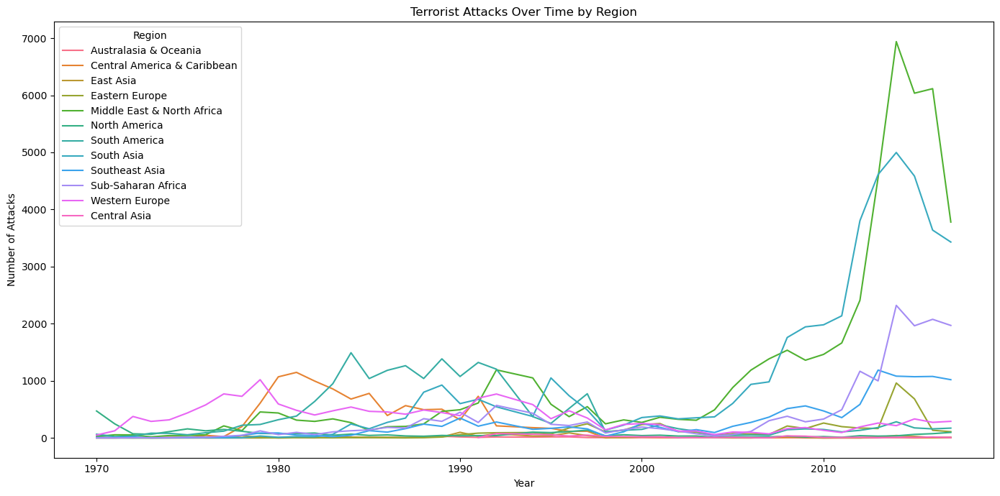

In [26]:
plt.figure(figsize=(14, 7))
sns.lineplot(data=attacks_per_region, x='iyear', y='attack_count', hue='region_txt')
plt.title("Terrorist Attacks Over Time by Region")
plt.xlabel("Year")
plt.ylabel("Number of Attacks")
plt.legend(title="Region")
plt.tight_layout()
plt.show()


FINDINGS:

Middle East & North Africa (green) has the most significant spike (peaking around 2014–2015)

South Asia also shows a long steady climb

Others stay flat or show fluctuations, not consistent increases

-- Between 2005 and 2015, the Middle East & North Africa (MENA) region experienced the most significant and consistent rise in terrorist attacks, peaking at over 7,000 incidents in 2014. This upward trend is notably steeper than in any other region. South Asia also showed sustained growth but at a lower magnitude. Between 1970 and 2018?? Middle East & North Africa experienced over 50,000 terrorist attacks.
Only ~12% were officially claimed by a group.
A staggering 70% were either unclaimed or unattributed, suggesting a high volume of decentralized or covert operations.

- Recommendation/Impact: 
Due to the sharp increase and intensity of attacks in MENA, I recommend prioritizing HUMINT collection and SIGINT tasking on regional actors operating post-2010. Special attention should be placed on the claim rates and group attribution for incidents between 2012–2015 to assess operational control and propaganda patterns.

-- Low claim rate = actors may not be using attacks as propaganda

-- High unknown rate = weak attribution, possible ISR/collection gap

-- May require stronger HUMINT, SIGINT, or forensic follow-up



In [27]:
# Filter for that region
region_df = df[df['region_txt'] == 'Middle East & North Africa']

# Count how many were claimed vs unclaimed
region_df['claimed'].value_counts()

# 0 No one has claimed -9 is unkown 1 = claimed


claimed
 0.0    35246
-9.0     9287
 1.0     5941
Name: count, dtype: int64

- 1. What’s the question?
- 2. What data do I need?
- 3. What are the patterns?
- 4. What could happen next? (prediction/trend)
- 5. What should we do about it?


<Axes: title={'center': 'Claim Status of Attacks in MENA'}, xlabel='claimed'>

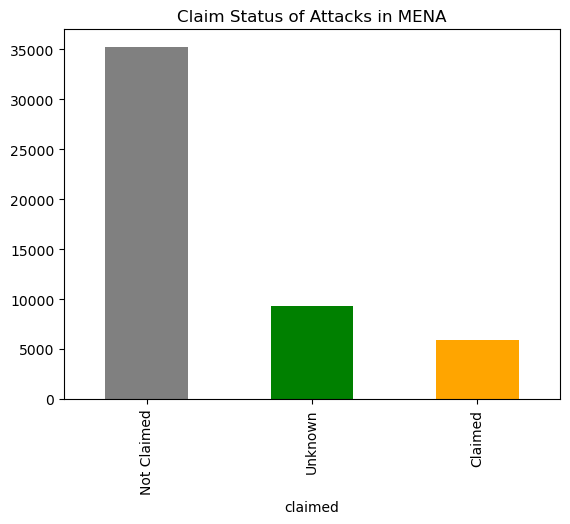

In [28]:
region_df['claimed'].replace({0: 'Not Claimed', 1: 'Claimed', -9: 'Unknown'}).value_counts().plot(
    kind='bar', color=['gray', 'green', 'orange'], title='Claim Status of Attacks in MENA')


In [29]:
region_df['gname'].value_counts().head(10)


gname
Unknown                                        29377
Islamic State of Iraq and the Levant (ISIL)     5563
Kurdistan Workers' Party (PKK)                  2137
Palestinians                                    1105
Houthi extremists (Ansar Allah)                 1062
Al-Qaida in the Arabian Peninsula (AQAP)        1017
Al-Qaida in Iraq                                 637
Sinai Province of the Islamic State              445
Palestinian Extremists                           440
Hamas (Islamic Resistance Movement)              407
Name: count, dtype: int64

Over 29K attacks are unattributed (more than 50%) → indicates widespread instability, low reporting, or covert operations

ISIL (ISIS) is the top known actor, with over 5.5K attacks in the region

Multiple Palestinian factions appear separately (Palestinians, Hamas, Palestinian Extremists)

You also see a spread of Sunni jihadist and Shi’a extremist groups — including Houthi and AQAP

PKK presence suggests overlap into Turkey/Iraq border regions (cross-region tension)



# Deep dive into ISIL

In [30]:
#How has ISIL’s activity changed over time, and what tactics are they using?

isil_df = region_df[region_df['gname'] == 'Islamic State of Iraq and the Levant (ISIL)']

#filtering by gname


In [31]:
isil_by_year = isil_df.groupby('iyear').size().reset_index(name='attack_count')
#now that its filtered by gname we want to filter by year aswell

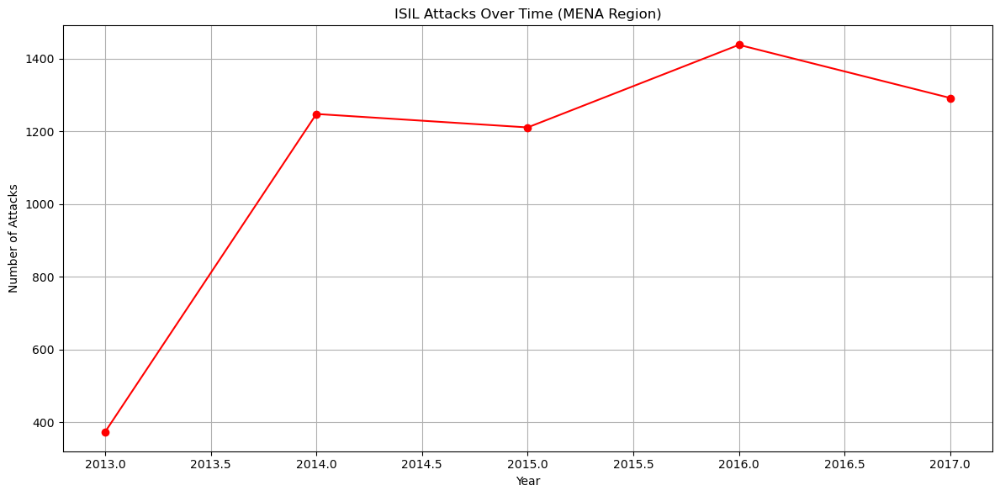

In [32]:
#Visualize ISIL Activity Over Time
plt.figure(figsize=(12, 6))
plt.plot(isil_by_year['iyear'], isil_by_year['attack_count'], marker='o', linestyle='-', color='red')
plt.title("ISIL Attacks Over Time (MENA Region)")
plt.xlabel("Year")
plt.ylabel("Number of Attacks")
plt.grid(True)
plt.tight_layout()
plt.show()


This showed a clear rise between 2013–2016, peaking around 2016.

That spike aligns with ISIL’s territorial control in Iraq and Syria.

Drop post-2016 reflects both military defeats and global counter-ISIS efforts.

In [33]:
#type of attacks?

isil_df['attacktype1_txt'].value_counts().head(5)


attacktype1_txt
Bombing/Explosion              3654
Unknown                         706
Hostage Taking (Kidnapping)     606
Armed Assault                   404
Assassination                   117
Name: count, dtype: int64

In [34]:
# Filter ISIL attacks
isil_df = df[df['gname'] == 'Islamic State of Iraq and the Levant (ISIL)']

# Remove rows with missing lat/lon
isil_df = isil_df.dropna(subset=['latitude', 'longitude'])


In [35]:
import folium
from folium.plugins import MarkerCluster

# Create base map centered around MENA 
map_isil = folium.Map(location=[33.5, 43.0], zoom_start=4, tiles='cartodbpositron')

# Add clustered markers
marker_cluster = MarkerCluster().add_to(map_isil)

# Loop through rows and add to map
for index, row in isil_df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{row['iyear']} – {row['city']}, {row['country_txt']}<br>Attack Type: {row['attacktype1_txt']}<br>Killed: {row['nkill']}",
        icon=folium.Icon(color='red', icon='fire')
    ).add_to(marker_cluster)

# Show the map (in notebook)
map_isil


This geo-clustering pins show Iraq and Syria as the core AO.

High attack density near Mosul, Baghdad, Raqqa = confirms ISIL strongholds.

Outliers in Libya, Turkey, Egypt, Russia, Philippines, Belgium, show cross-border ops and propaganda reach.



Over all Bluf for MENA

ISIL’s operational tempo in MENA sharply increased from 2013 to 2016, peaking at over 1,400 recorded attacks in 2016. These were concentrated around Iraq and Syria, with notable extensions into Libya and Egypt.
Mapping confirms these hotspots align with ISIL’s core territory during its declared caliphate.
ISIL’s primary attack method was Bombing/Explosion, with over 3,600 recorded uses, supporting their use of IEDs and VBIEDs as primary tactics.

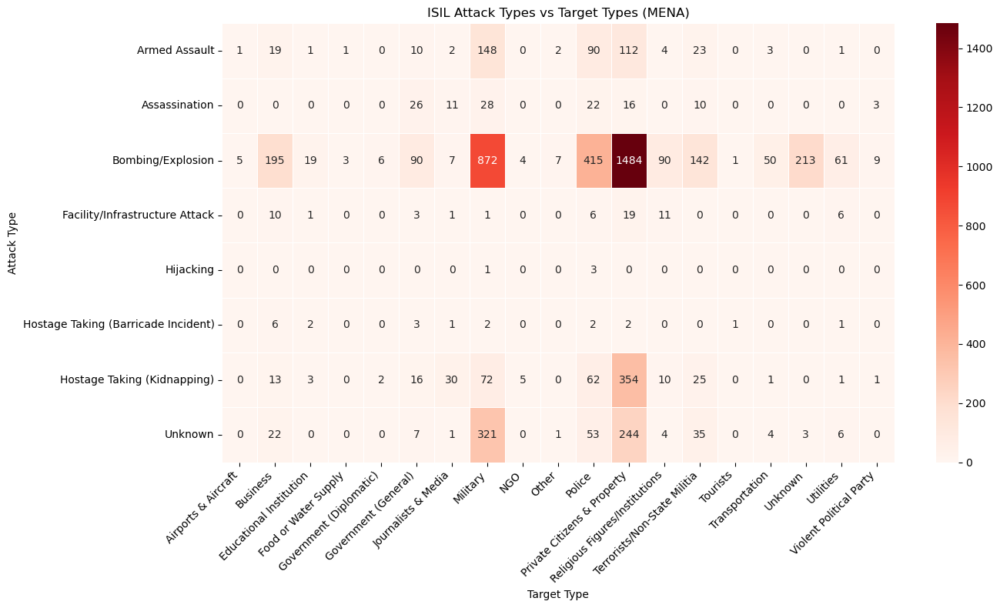

In [36]:
# Q: What types of targets does ISIL prefer, and how do those relate to their attack methods?

# Group by attacktype1_txt and targtype1_txt

# Count the number of attacks for each combo

# Visualize with a grouped bar chart or heatmap


# Group by attack type and target type
tactic_target = isil_df.groupby(['attacktype1_txt', 'targtype1_txt']).size().reset_index(name='count')

# Pivot the table to plot
pivot_tt = tactic_target.pivot(index='attacktype1_txt', columns='targtype1_txt', values='count').fillna(0)

# Plot it as a heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
sns.heatmap(pivot_tt, cmap="Reds", annot=True, fmt=".0f", linewidths=.5)
plt.title("ISIL Attack Types vs Target Types (MENA)")
plt.xlabel("Target Type")
plt.ylabel("Attack Type")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Darker = more attacks of that tactic against that target

Lighter = fewer attacks


BLUF: ISIL relies heavily on bombings to hit both state and civilian targets — this supports their use of VBIEDs and IEDs for mass disruption and anti-authority messaging. 2nd highest is Armed Assult Interpretation: These are likely raids, checkpoints ambushed, or firefights, It supports insurgent-style engagements in urban and rural zones.Hostage Taking (Kidnapping)Focused on Military, Government, and Private Citizens

Interpretation: Likely used for propaganda, ransoms, or psychological warfare (e.g. journalists, foreign nationals, or local officials)

ISIL targets both state and civilian structures with bombs

Their fallback tactic is direct armed assault

They selectively use hostage tactics, especially for strategic or media value

Police are a major enemy - strong justification for counterterror funding toward local policing efforts

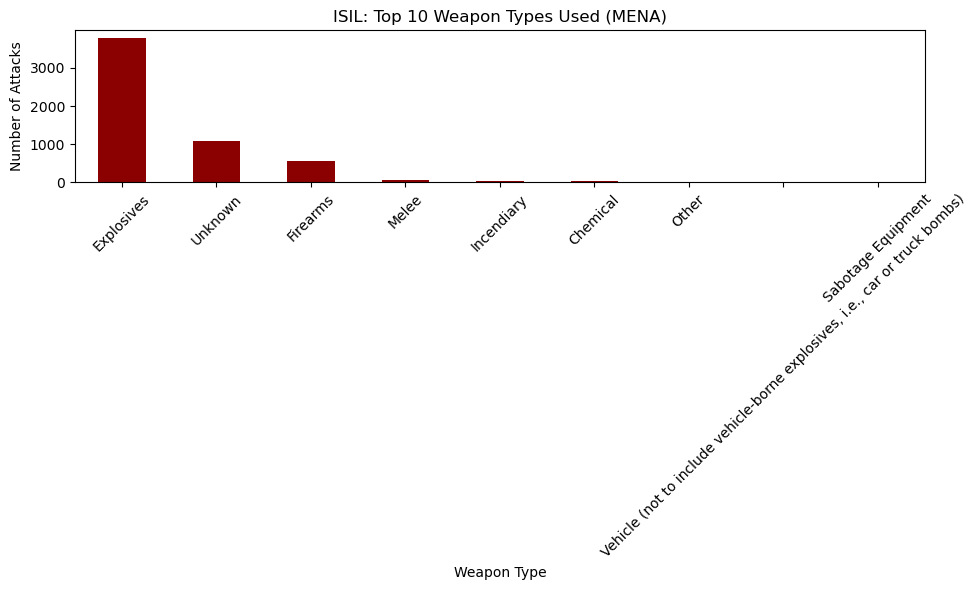

In [37]:
#What weapons ISIL uses most

# Which weapons align with their favorite tactics

isil_df['weaptype1_txt'].value_counts().head(10)
import matplotlib.pyplot as plt

weapon_counts = isil_df['weaptype1_txt'].value_counts().head(10)

plt.figure(figsize=(10, 6))
weapon_counts.plot(kind='bar', color='darkred')
plt.title("ISIL: Top 10 Weapon Types Used (MENA)")
plt.xlabel("Weapon Type")
plt.ylabel("Number of Attacks")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [38]:
#Match Weapon Use to Casualties
isil_df.groupby('weaptype1_txt')['nkill'].sum().sort_values(ascending=False).head(10)


weaptype1_txt
Explosives                                                                     22990.0
Unknown                                                                         8777.0
Firearms                                                                        6496.0
Melee                                                                            248.0
Incendiary                                                                       146.0
Other                                                                             73.0
Chemical                                                                          45.0
Sabotage Equipment                                                                 0.0
Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)        0.0
Name: nkill, dtype: float64

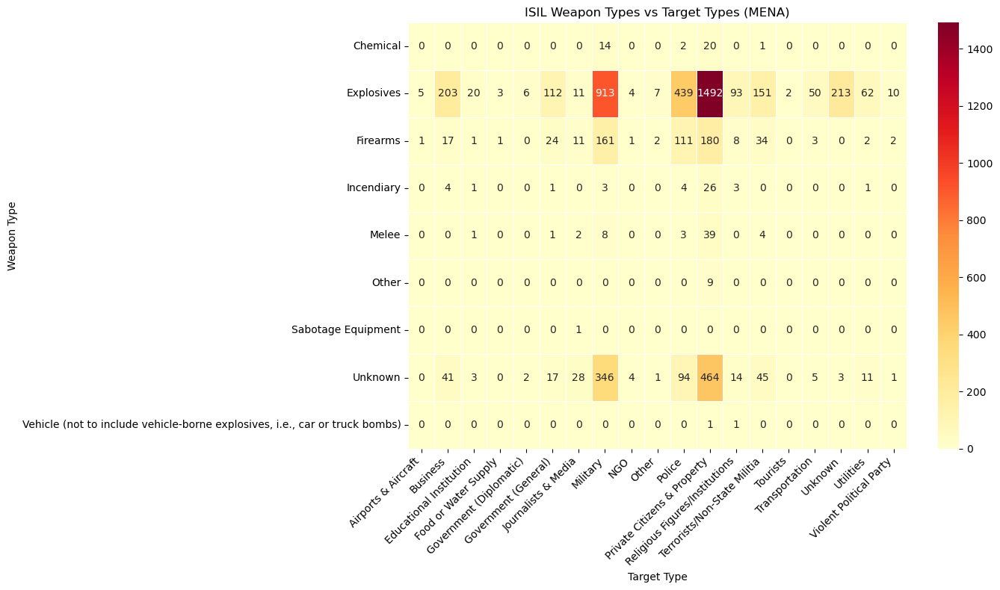

In [52]:
#  Show what weapons ISIL uses against what kinds of targets.

weapon_target = isil_df.groupby(['weaptype1_txt', 'targtype1_txt']).size().reset_index(name='count')
pivot_wt = weapon_target.pivot(index='weaptype1_txt', columns='targtype1_txt', values='count').fillna(0)
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 8))
sns.heatmap(pivot_wt, cmap="YlOrRd", annot=True, fmt=".0f", linewidths=.5)
plt.title("ISIL Weapon Types vs Target Types (MENA)")
plt.xlabel("Target Type")
plt.ylabel("Weapon Type")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


- BLUF: Explosives are ISIL’s go-to weapon, especially for targeting state control (police, government) and terrorizing civilians.- 
- fire arms -  Likely used in raids, checkpoints, and direct engagements
- Chemical, Incendiary, and Melee- Very low use - Rare tactics, likely symbolic or opportunistic ➤ Indicates no widespread chemical capability
-ISIL’s primary combat strategy is bomb-heavy insurgency

They operate with a blend of IED-based terror and direct armed confrontations

High targeting of police = effort to destabilize local enforcement

Low-tech methods like melee and sabotage are rare → not a low-skill force 

# Group Comparison — ISIL vs AQAP vs Boko Haram

In [40]:
#Group Comparison — ISIL vs AQAP vs Boko Haram

group_df = df[df['gname'].isin([
    'Islamic State of Iraq and the Levant (ISIL)',
    'Al-Qaida in the Arabian Peninsula (AQAP)',
    'Boko Haram'
])]


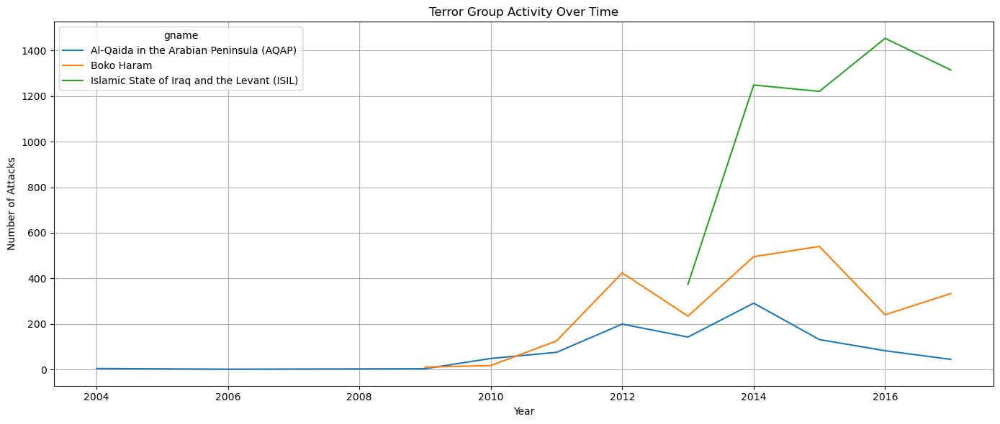

In [41]:
group_years = group_df.groupby(['iyear', 'gname']).size().reset_index(name='attack_count')

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 6))
sns.lineplot(data=group_years, x='iyear', y='attack_count', hue='gname')
plt.title("Terror Group Activity Over Time")
plt.xlabel("Year")
plt.ylabel("Number of Attacks")
plt.grid(True)
plt.tight_layout()
plt.show()


BLUF: ISIL had the highest tempo and most sustained ops across the region. BH surged quickly but declined. AQAP’s impact is smaller but targeted.

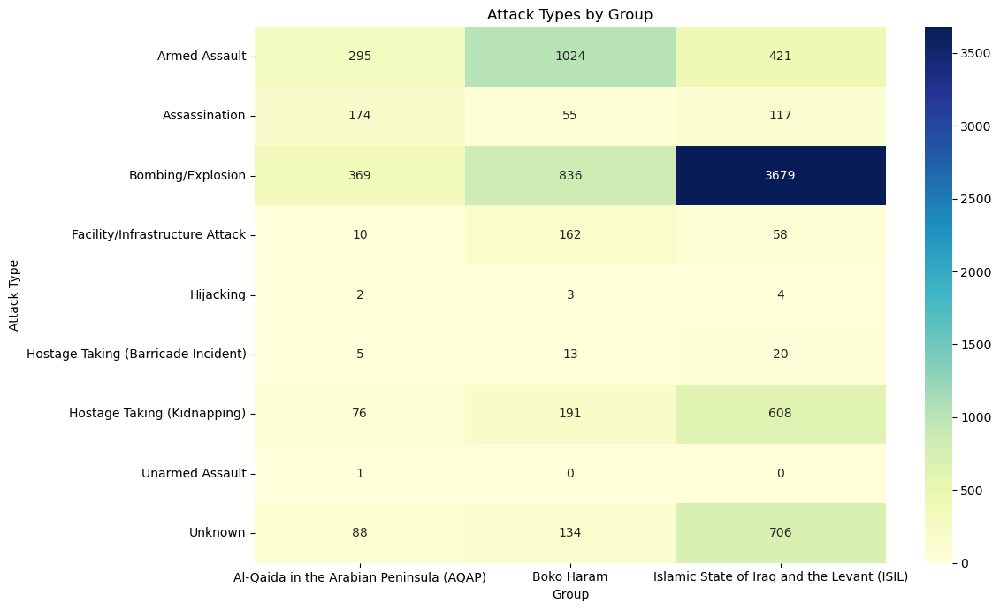

In [42]:
group_tactics = group_df.groupby(['gname', 'attacktype1_txt']).size().reset_index(name='count')

pivot_tactics = group_tactics.pivot(index='attacktype1_txt', columns='gname', values='count').fillna(0)

plt.figure(figsize=(12, 7))
sns.heatmap(pivot_tactics, annot=True, fmt=".0f", cmap='YlGnBu')
plt.title("Attack Types by Group")
plt.ylabel("Attack Type")
plt.xlabel("Group")
plt.tight_layout()
plt.show()


ISIL = tactical IED warfare + hostage use

Boko Haram = infantry-style raids

AQAP = surgical terror (bombings + assassinations)

Between 2010 and 2017, ISIL conducted the highest volume of terrorist operations, using bombings (~3,600) and hostage-taking (~600) as primary methods.
Boko Haram relied on small arms raids (1,000+ armed assaults), while AQAP focused on lower-volume, targeted ops with notable use of assassinations.
These differences reflect distinct org structures, capability levels, and media/recruitment strategies.

# Predicting Claimed Attacks

In [43]:
# Filter out rows where claimed is -9 (unknown)
model_df = df[df['claimed'] != -9].copy()

# Convert 'claimed' to int
model_df['claimed'] = model_df['claimed'].astype(int)

# Select relevant features
features = ['attacktype1_txt', 'weaptype1_txt', 'region_txt', 'targtype1_txt']
X = model_df[features]
y = model_df['claimed']


In [44]:
X_encoded = pd.get_dummies(X, drop_first=True)


In [45]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)


In [46]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [47]:
from sklearn.metrics import classification_report, accuracy_score

y_pred = model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))


Accuracy: 0.8297107800175285
              precision    recall  f1-score   support

           0       0.83      1.00      0.91     18932
           1       0.53      0.00      0.01      3888

    accuracy                           0.83     22820
   macro avg       0.68      0.50      0.46     22820
weighted avg       0.78      0.83      0.75     22820



In [48]:

coefficients = pd.Series(model.coef_[0], index=X_encoded.columns)
top_features = coefficients.abs().sort_values(ascending=False).head(10)
print(top_features)


attacktype1_txt_Hostage Taking (Barricade Incident)    1.245811
region_txt_Central Asia                                1.184828
region_txt_Eastern Europe                              1.149938
targtype1_txt_Unknown                                  1.006772
weaptype1_txt_Other                                    0.926300
region_txt_Western Europe                              0.828171
region_txt_North America                               0.827487
targtype1_txt_Tourists                                 0.826440
region_txt_Southeast Asia                              0.768908
targtype1_txt_Airports & Aircraft                      0.728383
dtype: float64


Our logistic model shows 83% accuracy overall, but struggles to identify claimed attacks due to class imbalance.
The most predictive features for claims include hostage tactics, Western regions, and symbolic targets like airports or tourists.
Recommend focused monitoring of hostage-style attacks in Central/Eastern Europe and better data curation for balanced modeling.

In [49]:
# Step 1: Logistic Regression with Balanced Weights

from sklearn.linear_model import LogisticRegression

# Retrain with class weights
balanced_model = LogisticRegression(max_iter=1000, class_weight='balanced')
balanced_model.fit(X_train, y_train)

# Predict again
y_pred_bal = balanced_model.predict(X_test)


In [50]:
from sklearn.metrics import classification_report, accuracy_score
# Re-Evaluate the Model
print("Balanced Accuracy:", accuracy_score(y_test, y_pred_bal))
print(classification_report(y_test, y_pred_bal))


Balanced Accuracy: 0.589877300613497
              precision    recall  f1-score   support

           0       0.89      0.57      0.70     18932
           1       0.24      0.66      0.36      3888

    accuracy                           0.59     22820
   macro avg       0.57      0.62      0.53     22820
weighted avg       0.78      0.59      0.64     22820



BLUF: massively improved recall on the “Claimed” class — now capturing ~66% of claimed attacks (vs 0% before).
This comes with a trade-off: overall accuracy dropped to 59%, but that’s expected. The model now prioritizes finding the rare but critical class.

In [51]:
#Check Feature Impact 

balanced_coefficients = pd.Series(balanced_model.coef_[0], index=X_encoded.columns)
top_balanced_features = balanced_coefficients.abs().sort_values(ascending=False).head(10)
print(top_balanced_features)


attacktype1_txt_Hostage Taking (Barricade Incident)    1.436580
region_txt_Central Asia                                1.205624
region_txt_Eastern Europe                              1.052141
weaptype1_txt_Other                                    1.039557
region_txt_North America                               0.989911
targtype1_txt_Unknown                                  0.950161
region_txt_Western Europe                              0.907218
targtype1_txt_Tourists                                 0.813286
targtype1_txt_Airports & Aircraft                      0.748202
targtype1_txt_Military                                 0.745535
dtype: float64


Pattern: Claimed attacks are often calculated, symbolic, and PR-oriented. They’re less about random violence, more about messaging.

BLUF: after balancing the dataset, our logistic model captures 66% of claimed terrorist attacks, identifying key drivers such as hostage-style tactics, Western regions, and symbolic targets (e.g., airports, tourists, military).
These features strongly correlate with groups seeking media attention or operational credibility.
Recommend increased ISR tasking in these combinations, especially when attacks involve non-standard weapons or occur in Central Asia and Europe.